# This notebook was written and run from the 6b directory and then relocated to 6d folder ###pay attention to directory 

In [ ]:
pwd

# Combine Loom

In [ ]:
#Combine Loom files (PoolA, B, C) # This needs to be done only once to generate a combined file

In [ ]:
#import loompy 

In [ ]:
#The step bellow was already performed and combined loom file already exists
#this is done by combining poolA,B and C from the velocyto pipeline 
#done using cloude compute

In [ ]:
#files = ['./9_6b_mouseDTRopt_RNAvelocity/Velocyto_data/loomA/PoolA.loom',
#        './9_6b_mouseDTRopt_RNAvelocity/Velocyto_data/loomB/PoolB.loom',
 #       './9_6b_mouseDTRopt_RNAvelocity/Velocyto_data/loomC/PoolC.loom']
#out_file = './9_6b_mouseDTRopt_RNAvelocity/Velocyto_data/combined_samples.loom'

In [ ]:
#loompy.combine(files, out_file)

In [ ]:
#data = loompy.connect(out_file)

In [ ]:
#data

In [ ]:
#data.close()

# VELOCITY

## PREP ANDATA OBJECT

In [1]:
import scvelo as scv
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

scv.settings.set_figure_params('scvelo')

In [2]:
adata = scv.read('./9_6b_mouseDTRopt_RNAvelocity/Velocyto_data/combined_samples.loom')

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [3]:
adata.var_names_make_unique()

In [4]:
adata

AnnData object with n_obs × n_vars = 48350 × 31053 
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

# EC all time points

In [5]:
metadata = pd.read_csv("/Users/rafaelgodoy/Documents/CODE/6d_mouse_nov2020_final/3_data_figs/ECs_metadata.csv")
genes = pd.read_csv("/Users/rafaelgodoy/Documents/CODE/6d_mouse_nov2020_final/3_data_figs/ECs_genes.csv")
cells = metadata['Barcode']
sample_adata = adata[cells.values, :]
sample_adata[:, np.intersect1d(genes.values,sample_adata.var_names.values)]
sample_adata.obsm['X_pca'] = np.column_stack([metadata['PC1'].values, 
                                             metadata['PC2'].values])
sample_adata.obsm['X_umap'] = np.column_stack([metadata['UMAP1'].values,
                                               metadata['UMAP2'].values])
sample_adata.obs['Totalcells'] = metadata['Totalcells'].values
sample_adata.obs['Annotation'] = metadata['Annotation'].values
sample_adata.obs['Sample'] = metadata['Sample'].values
sample_adata.obs['Pool'] = metadata['orig.ident'].values
sample_adata.obs['Cluster'] = metadata['seurat_clusters'].values
sample_adata.obs['Phase'] = metadata['Phase'].values

In [6]:
data = sample_adata
scv.pp.show_proportions(data)
#scv.pp.cleanup(data, clean='all') -- seems to get rid of sample annotations??
scv.pp.filter_and_normalize(data, min_counts=20, min_counts_u=10, n_top_genes=3000)
scv.pp.moments(data)
scv.tl.velocity(data)
scv.tl.velocity_graph(data)
scv.tl.velocity_embedding(data, basis='umap')

Abundance of ['spliced', 'unspliced', 'ambiguous']: [0.56 0.36 0.07]
Filtered out 20513 genes that are detected in less than 20 counts (spliced).
Filtered out 2024 genes that are detected in less than 10 counts (unspliced).
Normalized count data: X, spliced, unspliced.
Logarithmized X.
computing neighbors
    finished (0:00:04) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


In [ ]:
scv.pl.velocity_embedding_grid(data, basis='umap', color="Sample", legend_loc='right margin', arrow_size=1.75,
                              n_neighbors=30, scale=1, dpi=300, size=50, density=0.7, save='0001_EC_velocyto.pdf')

... storing 'Totalcells' as categorical


saving figure to file ./figures/scvelo_0004_ECs.pdf


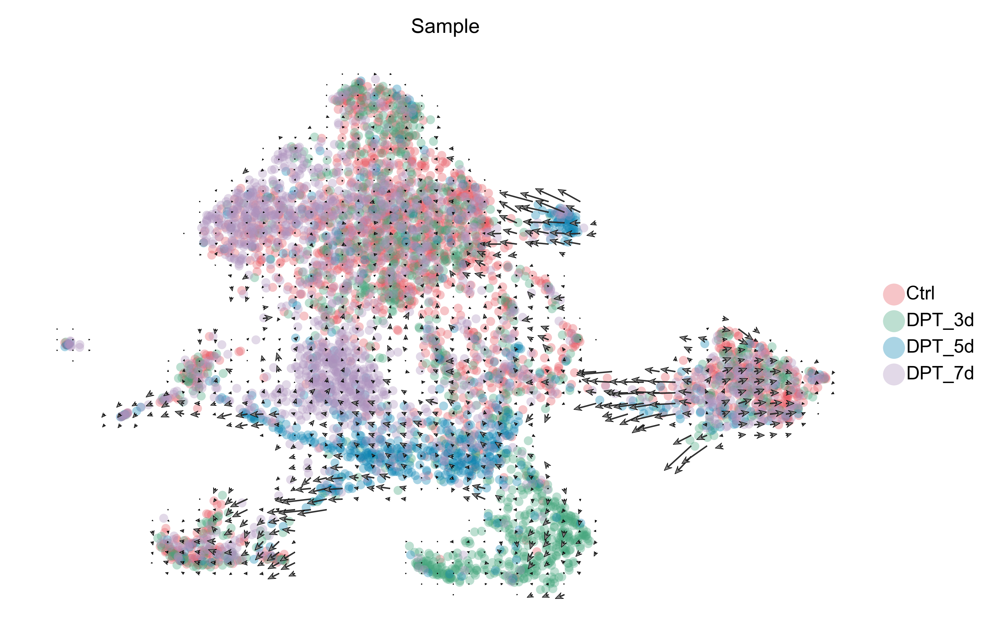

In [7]:
scv.pl.velocity_embedding_grid(data, basis='umap', color="Sample", alpha=0.35,
                               palette=['#E75B64', '#44A57C', '#0E84B4', '#AE93BE'],
                               legend_loc='right margin', arrow_size=1.5,
                              n_neighbors=20, scale=1, dpi=300, size=50, 
                               density=1, smooth=0.5,
                               save='0004_ECs.pdf')

saving figure to file ./figures/scvelo_00044_ECs.pdf


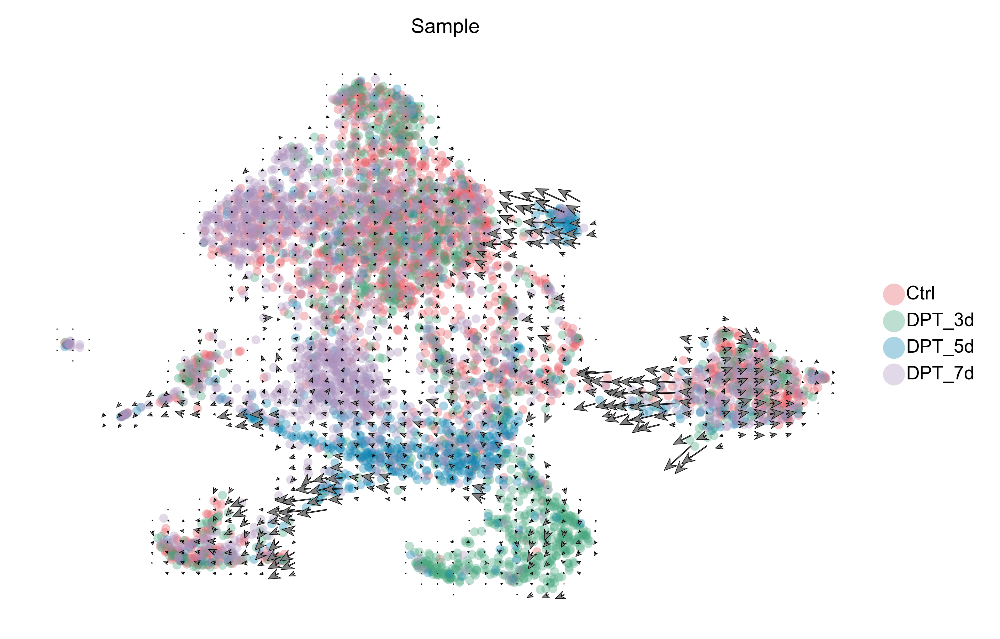

In [8]:
scv.pl.velocity_embedding_grid(data, basis='umap', color="Sample", alpha=0.35,
                               palette=['#E75B64', '#44A57C', '#0E84B4', '#AE93BE'],
                               legend_loc='right margin', arrow_size=2.5,
                              n_neighbors=20, scale=1, dpi=300, size=50, 
                               density=1, smooth=0.5,
                               save='00044_ECs.pdf')

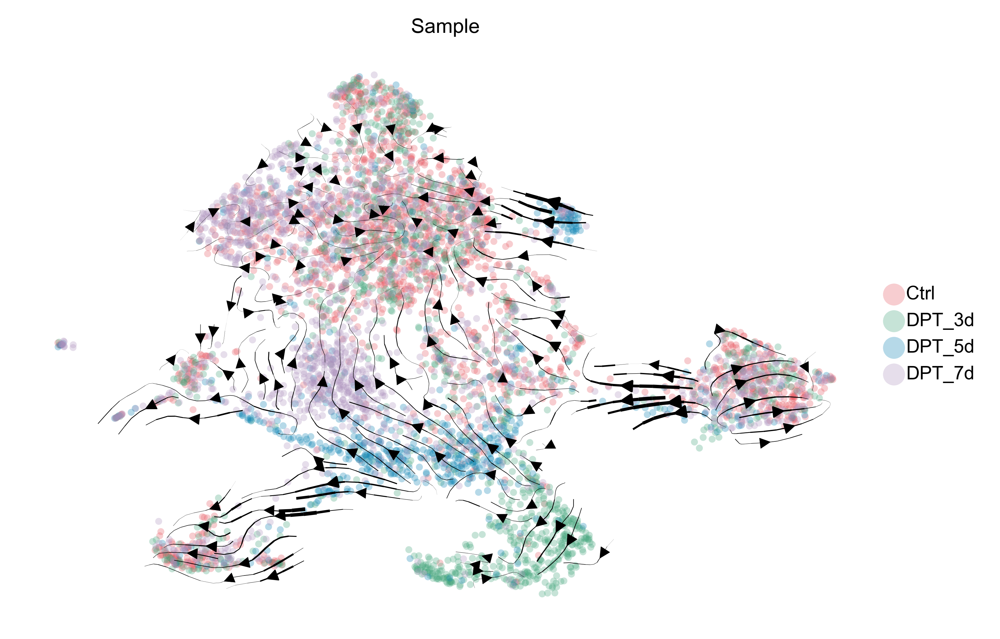

In [9]:
scv.pl.velocity_embedding_stream(data, basis='umap', legend_loc='right margin',
                                     smooth=0.5, n_neighbors=20, density=1,
                                     color='Sample', size=30,
                                     dpi=300)

saving figure to file ./figures/scvelo_000444_global.pdf


ValueError: Can only output finite numbers in PDF

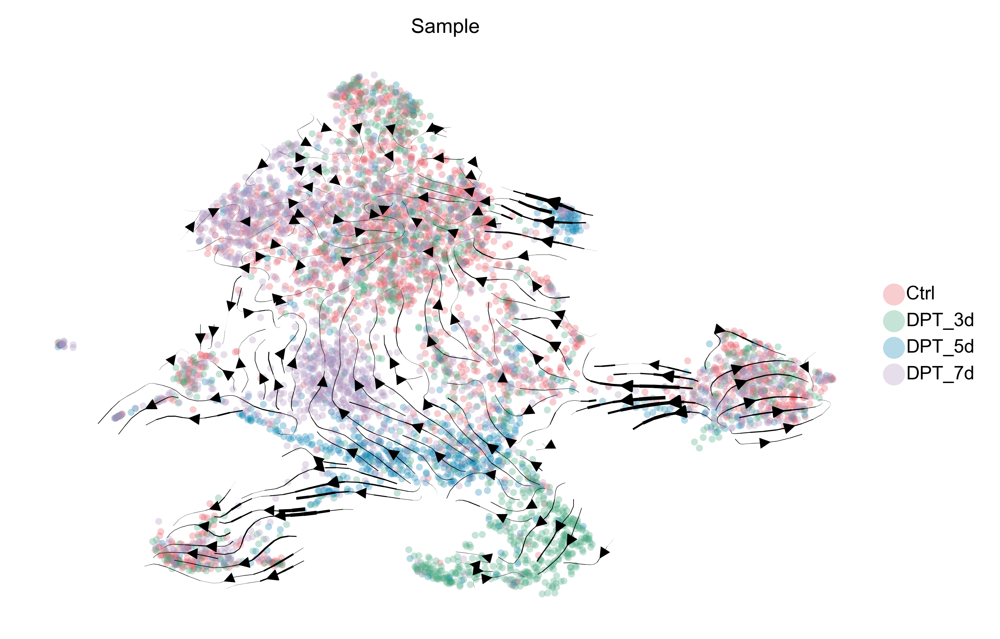

In [10]:
scv.pl.velocity_embedding_stream(data, basis='umap', legend_loc='right margin',
                                     smooth=0.5, n_neighbors=20, density=1,
                                     color='Sample', size=30,
                                     dpi=300, save='000444_global.pdf')

In [ ]:
scv.tl.recover_dynamics(data)
scv.tl.velocity(data, mode='dynamical')
scv.tl.velocity_graph(data)

In [ ]:
scv.pl.velocity_embedding_grid(data, basis='umap', color="Sample", legend_loc='right margin', arrow_size=1.75,
                              n_neighbors=30, scale=1, dpi=300, size=50, density=0.65, save='0002_global.pdf')

In [ ]:
scv.pl.velocity_embedding_stream(data, basis='umap', legend_loc='right margin',
                                     smooth=0.5, n_neighbors=20, density=1,
                                     color='Sample', size=30,
                                     dpi=300, save='0003_global.pdf')